In [4]:
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure 

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) # Adjust the configuration of the plots we will create

# Read the data

df = pd.read_csv(r'C:\Users\kleme\OneDrive\DataScience\movies.csv')

In [3]:
# Looking at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [5]:
# Missing data search

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [6]:
#Checking what data types are in the dataset
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [25]:
#Changing data type of columns

df['budget']

#Budget column contains NA or inf values hence converting NA to 0

df['budget'] = df['budget'].fillna(0) 

df['budget'] = df['budget'].astype('int64')

df['gross']

df['gross'] = df['budget'].fillna(0)

df['gross'] = df['gross'].astype('int64')

In [26]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,19000000,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,4500000,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,18000000,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,3500000,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,6000000,Orion Pictures,98.0


In [43]:
#drop null values

df = df.dropna()

In [45]:
df['released'] = df['released'].fillna(0)

In [48]:
df['yearcorrect'] = df['released'].astype(str).str.split(',').str[-1].astype(str).str[:4]

In [49]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,356000000,Marvel Studios,181.0,201
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,321000000,Marvel Studios,149.0,201
7075,Star Wars: Episode VIII - The Last Jedi,PG-13,Action,2017,"December 15, 2017 (United States)",7.0,581000.0,Rian Johnson,Rian Johnson,Daisy Ridley,United States,317000000,317000000,Walt Disney Pictures,152.0,201
7066,Justice League,PG-13,Action,2017,"November 17, 2017 (United States)",6.1,418000.0,Zack Snyder,Jerry Siegel,Ben Affleck,United States,300000000,300000000,Warner Bros.,120.0,201
5060,Pirates of the Caribbean: at World's End,PG-13,Action,2007,"May 25, 2007 (United States)",7.1,608000.0,Gore Verbinski,Ted Elliott,Johnny Depp,United States,300000000,300000000,Walt Disney Pictures,169.0,200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1287,The Accidental Tourist,PG,Drama,1988,"January 6, 1989 (United States)",6.8,15000.0,Lawrence Kasdan,Anne Tyler,William Hurt,United States,0,0,Warner Bros.,121.0,198
1283,Two Moon Junction,R,Drama,1988,"April 29, 1988 (United States)",5.1,5200.0,Zalman King,Zalman King,Sherilyn Fenn,United States,0,0,DDM Film Corporation,104.0,198
1279,The Big Blue,PG,Adventure,1988,"August 19, 1988 (United States)",7.6,49000.0,Luc Besson,Luc Besson,Jean-Marc Barr,France,0,0,Gaumont,168.0,198
3950,Waking Life,R,Animation,2001,"March 7, 2002 (Australia)",7.8,62000.0,Richard Linklater,Richard Linklater,Ethan Hawke,United States,0,0,Fox Searchlight Pictures,99.0,200


In [50]:
# Display all data
pd.set_option('display.max_rows', None)

In [51]:
# Drop duplicates to show distinct values

df['company'].drop_duplicates().sort_values(ascending=False)

7129                                              thefyzz
5664                                          micro_scope
6412                             iDeal Partners Film Fund
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
524                             Zupnik-Curtis Enterprises
3330                          Zucker Brothers Productions
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
6222                        Zentropa International Norway
3698                              Zentropa Entertainments
535                                  Zenith Entertainment
5180                                      Zazen Produções
3193                                          ZapPictures
1321                             Zanuck/Brown Productions
1329          

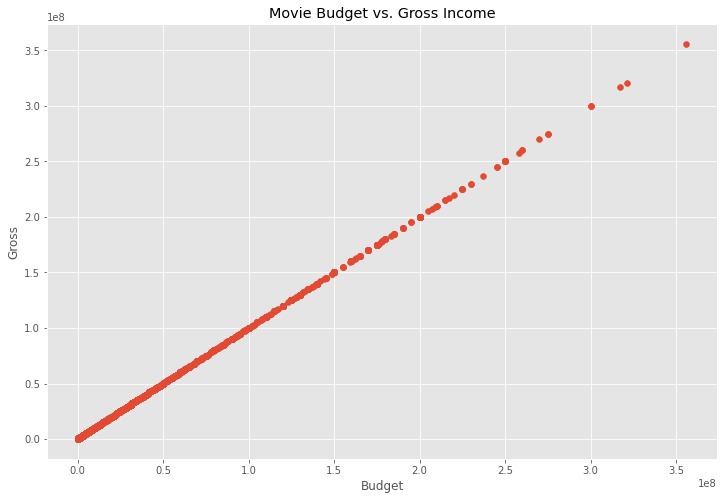

In [53]:
#Build Scatterplot Budget vs Gross

plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Movie Budget vs. Gross Income')
plt.xlabel('Budget')
plt.ylabel('Gross')
plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

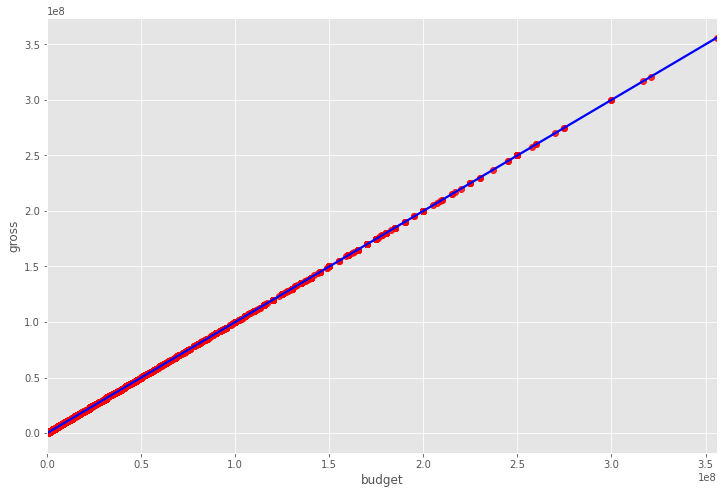

In [55]:
# Plot budget vs gross using seaborn
sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color":"blue"})

In [56]:
# Positive correlation found between budget and gross
# Exploring the correlation further

# Pearson correlation
df.corr()

,year,score,votes,budget,gross,runtime
year,1.000000,0.102346,0.226895,0.314842,0.314842,0.120676
score,0.102346,1.000000,0.411931,0.056781,0.056781,0.400574
votes,0.226895,0.411931,1.000000,0.485301,0.485301,0.309366
budget,0.314842,0.056781,0.485301,1.000000,1.000000,0.270042
gross,0.314842,0.056781,0.485301,1.000000,1.000000,0.270042
runtime,0.120676,0.400574,0.309366,0.270042,0.270042,1.000000


In [57]:
df.corr(method='kendall')

,year,score,votes,budget,gross,runtime
year,1.000000,0.070606,0.339302,0.214967,0.214967,0.096862
score,0.070606,1.000000,0.304058,-0.004328,-0.004328,0.284159
votes,0.339302,0.304058,1.000000,0.436356,0.436356,0.198342
budget,0.214967,-0.004328,0.436356,1.000000,1.000000,0.177497
gross,0.214967,-0.004328,0.436356,1.000000,1.000000,0.177497
runtime,0.096862,0.284159,0.198342,0.177497,0.177497,1.000000


In [58]:
df.corr(method='spearman')

,year,score,votes,budget,gross,runtime
year,1.000000,0.103391,0.482954,0.299861,0.299861,0.142587
score,0.103391,1.000000,0.433536,-0.006236,-0.006236,0.400655
votes,0.482954,0.433536,1.000000,0.600785,0.600785,0.290511
budget,0.299861,-0.006236,0.600785,1.000000,1.000000,0.249102
gross,0.299861,-0.006236,0.600785,1.000000,1.000000,0.249102
runtime,0.142587,0.400655,0.290511,0.249102,0.249102,1.000000


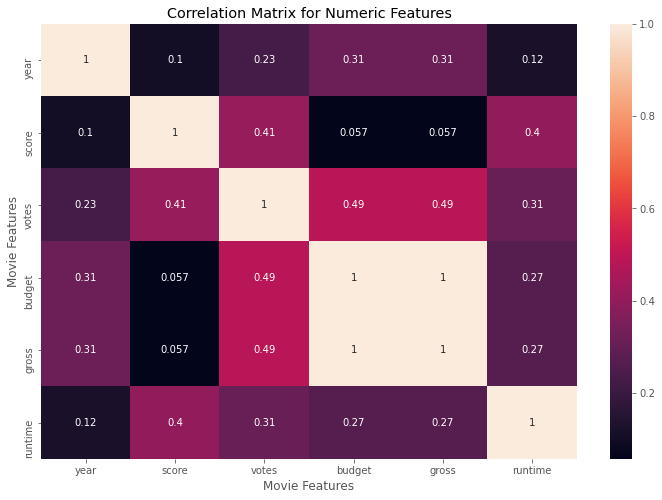

In [60]:
# Visualize the correlations
correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [61]:
df.apply(lambda x: x.factorize()[0]).corr(method='pearson')

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
name,1.000000,0.149123,0.036784,0.965105,0.959218,-0.046454,0.284749,0.744053,0.804239,0.728462,0.140205,0.279177,0.279177,0.589497,0.048395,0.905090
rating,0.149123,1.000000,-0.088864,0.161832,0.151337,0.013871,0.109071,0.091812,0.110186,0.099980,0.008614,0.191793,0.191793,-0.021477,0.035060,0.158269
genre,0.036784,-0.088864,1.000000,0.037581,0.036340,-0.004098,0.023077,0.047868,0.038037,0.037692,-0.013389,0.071218,0.071218,0.007107,-0.000745,0.033916
year,0.965105,0.161832,0.037581,1.000000,0.994008,-0.044684,0.310081,0.769220,0.824923,0.753942,0.137693,0.301734,0.301734,0.599609,0.050205,0.935110
released,0.959218,0.151337,0.036340,0.994008,1.000000,-0.045263,0.297394,0.770000,0.819914,0.752951,0.145224,0.287639,0.287639,0.605664,0.047015,0.924211
score,-0.046454,0.013871,-0.004098,-0.044684,-0.045263,1.000000,-0.013658,-0.024317,-0.036242,-0.009438,0.025379,-0.013855,-0.013855,-0.028298,0.027105,-0.044852
votes,0.284749,0.109071,0.023077,0.310081,0.297394,-0.013658,1.000000,0.184182,0.218703,0.172902,-0.046742,0.403709,0.403709,-0.002373,0.108869,0.289000
director,0.744053,0.091812,0.047868,0.769220,0.770000,-0.024317,0.184182,1.000000,0.748173,0.679539,0.155189,0.110164,0.110164,0.547867,-0.011617,0.711173
writer,0.804239,0.110186,0.038037,0.824923,0.819914,-0.036242,0.218703,0.748173,1.000000,0.674404,0.156250,0.189069,0.189069,0.544346,0.032056,0.781066
star,0.728462,0.099980,0.037692,0.753942,0.752951,-0.009438,0.172902,0.679539,0.674404,1.000000,0.179577,0.112681,0.112681,0.522984,0.035270,0.699826


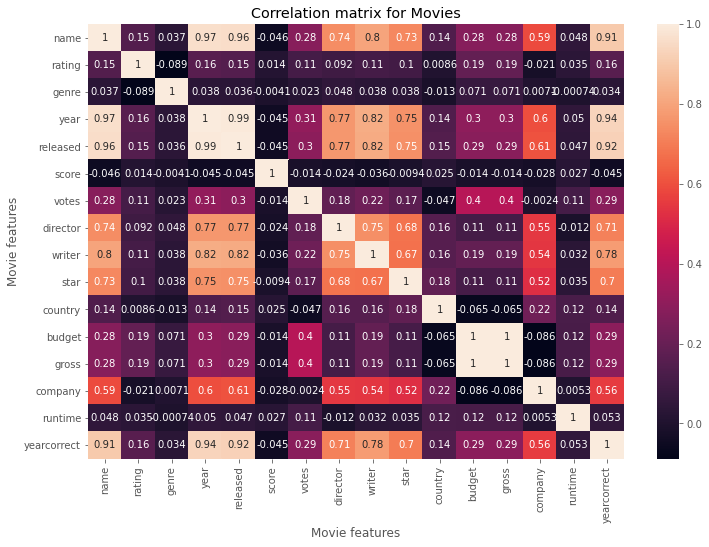

In [62]:
correlation_matrix = df.apply(lambda x: x.factorize()[0]).corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Movies")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

In [63]:
correlation_mat = df.apply(lambda x: x.factorize()[0]).corr()

corr_pairs = correlation_mat.unstack()

print(corr_pairs)

name         name           1.000000
             rating         0.149123
             genre          0.036784
             year           0.965105
             released       0.959218
             score         -0.046454
             votes          0.284749
             director       0.744053
             writer         0.804239
             star           0.728462
             country        0.140205
             budget         0.279177
             gross          0.279177
             company        0.589497
             runtime        0.048395
             yearcorrect    0.905090
rating       name           0.149123
             rating         1.000000
             genre         -0.088864
             year           0.161832
             released       0.151337
             score          0.013871
             votes          0.109071
             director       0.091812
             writer         0.110186
             star           0.099980
             country        0.008614
 

In [65]:
sorted_pairs = corr_pairs.sort_values(kind='quicksort')

print(sorted_pairs)

rating       genre         -0.088864
genre        rating        -0.088864
company      gross         -0.086194
             budget        -0.086194
gross        company       -0.086194
budget       company       -0.086194
country      gross         -0.065245
             budget        -0.065245
budget       country       -0.065245
gross        country       -0.065245
country      votes         -0.046742
votes        country       -0.046742
name         score         -0.046454
score        name          -0.046454
             released      -0.045263
released     score         -0.045263
yearcorrect  score         -0.044852
score        yearcorrect   -0.044852
year         score         -0.044684
score        year          -0.044684
             writer        -0.036242
writer       score         -0.036242
score        company       -0.028298
company      score         -0.028298
director     score         -0.024317
score        director      -0.024317
rating       company       -0.021477
c

In [67]:
# Show the ones that have a high correlation (> 0.5)

strong_pairs = sorted_pairs[abs(sorted_pairs) > 0.5 ]

print(strong_pairs)

company      star           0.522984
star         company        0.522984
writer       company        0.544346
company      writer         0.544346
director     company        0.547867
company      director       0.547867
yearcorrect  company        0.556002
company      yearcorrect    0.556002
name         company        0.589497
company      name           0.589497
year         company        0.599609
company      year           0.599609
released     company        0.605664
company      released       0.605664
star         writer         0.674404
writer       star           0.674404
star         director       0.679539
director     star           0.679539
star         yearcorrect    0.699826
yearcorrect  star           0.699826
director     yearcorrect    0.711173
yearcorrect  director       0.711173
name         star           0.728462
star         name           0.728462
name         director       0.744053
director     name           0.744053
writer       director       0.748173
d

In [70]:
#Top 15 companies by gross value

CompanyGrossSum = df.groupby('company')[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values('gross', ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64')

CompanyGrossSumSorted


company
Warner Bros.                 19503300000
Universal Pictures           15989730001
Columbia Pictures            15512107000
Paramount Pictures           13723450000
Twentieth Century Fox        11474600000
Walt Disney Pictures         10404700000
New Line Cinema               5645200000
Touchstone Pictures           4153700000
Dreamworks Pictures           3961700000
Metro-Goldwyn-Mayer (MGM)     3548250000
DreamWorks Animation          3344000000
Marvel Studios                2664000000
Summit Entertainment          2655269000
Fox 2000 Pictures             2329500000
TriStar Pictures              2089965000
Name: gross, dtype: int64

In [71]:
df['Year'] = df['released'].astype(str).str[:4]
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect,Year
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,19000000,Warner Bros.,146.0,198,June
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,4500000,Columbia Pictures,104.0,198,July
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,18000000,Lucasfilm,124.0,198,June
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,3500000,Paramount Pictures,88.0,198,July
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,6000000,Orion Pictures,98.0,198,July
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,550000,Paramount Pictures,95.0,198,May
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,27000000,Universal Pictures,133.0,198,June
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,18000000,Chartoff-Winkler Productions,129.0,198,Dece
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,54000000,Dovemead Films,127.0,198,June
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,10000000,United Artists,100.0,198,May


In [72]:
df.groupby(['company', 'year'])[["gross"]].sum()

gross
company                                            year            
"DIA" Productions GmbH & Co. KG                    2003    36000000
"Weathering With You" Film Partners                2019    11100000
.406 Production                                    1996      250000
1+2 Seisaku Iinkai                                 2000           0
10 West Studios                                    2010           0
120 Films                                          2002           0
120dB Films                                        2009           0
                                                   2016           0
1492 Pictures                                      1996    60000000
                                                   1999   100000000
1818 Productions                                   1983     5000000
19 Entertainment                                   2003    12000000
1978 Films                                         2017    18000000
1984 Private Defense Contractors                   2014    28000000
1992 Number Four Limited Partnership               1995           0
2 Loop Films                                       2002      500000
2.0 Entertainment                                  2019    42000000
2.4.7. Films                                       2007     7300000
2003 Productions                                   2004    56600000
20th Century Studios                               2020   135000000
21 Laps Entertainment                              2014    19800000
                                                   2018    34000000
21st Century Film Corporation                      1989           0
                                                   1990     4200000
21st Century Films                                 1994     5000000
25th Hour Productions                              2002     5000000
26 Films                                           2009    17000000
2929 Productions                                   2007    13000000
                                                   2008    54800000
                                                   2014    30000000
2DUX²                                              2016    30000000
                                                   2018    75000000
3 Arts Entertainment                               1996    50000000
                                                   1997    28000000
                                                   2001    49000000
                                                   2010     7000000
                                                   2013     1500000
                                                   2014    65000000
                                                   2015    20000000
                                                   2019     4000000
3 Miles Apart Productions Ltd.                     1999    33000000
3311 Productions                                   2013           0
                                                   2017     5000000
360 Pictures                                       2007    12000000
391 Productions                                    1998           0
                                                   1999           0
3B Productions                                     1999           0
                                                   2003           0
3Mark Entertainment                                2001     7000000
4 1/2 Film                                         2006           0
4 Kids Entertainment                               1999    30000000
40 Acres & A Mule Filmworks                        1986      175000
                                                   1989     6500000
                                                   1995    11000000
                                                   1999     9000000
                                                   2000    20000000
                                                   2004     8000000
49th Parallel Productions                         

In [75]:
CompanyGrossSum = df.groupby(['year', 'company'])[['gross']].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values(['gross', 'company', 'year'], ascending = False) [:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64')

CompanyGrossSumSorted

year  company             
2019  Walt Disney Pictures    1233000000
2006  Warner Bros.            1165500000
2011  Paramount Pictures      1026000000
2004  Warner Bros.             984000000
2011  Columbia Pictures        971500000
2010  Walt Disney Pictures     955000000
2006  Columbia Pictures        950000000
2008  Warner Bros.             938000000
2005  Warner Bros.             934000000
2017  Warner Bros.             929000000
      Walt Disney Pictures     902000000
2011  Warner Bros.             889000000
2005  Columbia Pictures        860000000
2009  Columbia Pictures        855600000
2012  Columbia Pictures        854000000
Name: gross, dtype: int64

In [77]:
 CompanyGrossSum = df.groupby(['company'])[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values(['gross','company'], ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company
Warner Bros.                 19503300000
Universal Pictures           15989730001
Columbia Pictures            15512107000
Paramount Pictures           13723450000
Twentieth Century Fox        11474600000
Walt Disney Pictures         10404700000
New Line Cinema               5645200000
Touchstone Pictures           4153700000
Dreamworks Pictures           3961700000
Metro-Goldwyn-Mayer (MGM)     3548250000
DreamWorks Animation          3344000000
Marvel Studios                2664000000
Summit Entertainment          2655269000
Fox 2000 Pictures             2329500000
TriStar Pictures              2089965000
Name: gross, dtype: int64

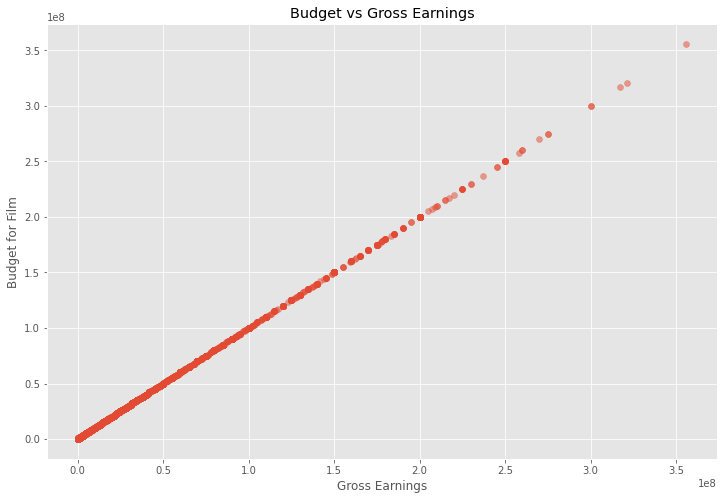

In [78]:
plt.scatter(x=df['budget'], y=df['gross'], alpha=0.5)
plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for Film')
plt.show()

In [79]:
df_numerized = df


for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect,Year
0,6506,6,6,1980,1685,8.4,927000.0,2544,3958,1022,54,19000000,19000000,2273,146.0,0,14
1,5498,6,1,1980,1472,5.8,65000.0,2233,1612,316,55,4500000,4500000,710,104.0,0,13
2,5073,4,0,1980,1751,8.7,1200000.0,1093,2534,1708,55,18000000,18000000,1505,124.0,0,14
3,282,4,4,1980,1472,7.7,221000.0,1279,1975,2197,55,3500000,3500000,1769,88.0,0,13
4,1016,6,4,1980,1523,7.3,108000.0,1037,511,398,55,6000000,6000000,1736,98.0,0,13
5,2088,6,9,1980,2474,6.4,123000.0,2486,4304,234,55,550000,550000,1769,95.0,0,16
6,5499,6,0,1980,1751,7.9,188000.0,1390,821,1250,55,27000000,27000000,2236,133.0,0,14
7,4374,6,3,1980,691,8.2,330000.0,1799,1747,2191,55,18000000,18000000,612,129.0,0,10
8,5210,4,0,1980,1733,6.8,101000.0,2267,1955,855,55,54000000,54000000,861,127.0,0,14
9,6133,6,3,1980,2260,7.0,10000.0,2816,413,572,55,10000000,10000000,2227,100.0,0,16


In [80]:
df_numerized.corr(method='pearson')

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect,Year
name,1.000000,-0.011924,0.015300,0.013514,-0.009906,0.016181,0.013180,0.009608,0.010217,0.005685,-0.009939,0.020825,0.020825,0.010073,0.011151,0.016886,-0.011091
rating,-0.011924,1.000000,0.117566,0.024989,0.024319,0.011538,0.016086,0.017205,-0.004387,0.005905,0.037738,-0.126806,-0.126806,-0.076807,0.069089,0.019072,0.021170
genre,0.015300,0.117566,1.000000,-0.088172,0.030625,0.040090,-0.148420,-0.013508,0.007351,-0.003525,-0.031485,-0.342064,-0.342064,-0.068678,-0.044631,-0.003662,0.028490
year,0.013514,0.024989,-0.088172,1.000000,-0.002088,0.102346,0.226895,-0.022765,-0.012318,-0.027691,-0.070266,0.314842,0.314842,-0.009026,0.120676,0.534972,-0.003922
released,-0.009906,0.024319,0.030625,-0.002088,1.000000,0.043175,0.016877,-0.001868,-0.003569,0.018026,-0.022109,0.009995,0.009995,-0.008570,0.000145,0.002571,0.995376
score,0.016181,0.011538,0.040090,0.102346,0.043175,1.000000,0.411931,0.008071,0.019084,-0.002193,-0.130094,0.056781,0.056781,0.000316,0.400574,0.074363,0.041866
votes,0.013180,0.016086,-0.148420,0.226895,0.016877,0.411931,1.000000,-0.000627,0.000177,-0.020977,0.069582,0.485301,0.485301,0.129596,0.309366,0.107464,0.017834
director,0.009608,0.017205,-0.013508,-0.022765,-0.001868,0.008071,-0.000627,1.000000,0.297479,0.037570,0.015245,0.004140,0.004140,0.001337,0.017386,-0.021544,-0.000558
writer,0.010217,-0.004387,0.007351,-0.012318,-0.003569,0.019084,0.000177,0.297479,1.000000,0.026584,0.014937,-0.027145,-0.027145,0.003035,-0.004526,-0.016011,-0.003791
star,0.005685,0.005905,-0.003525,-0.027691,0.018026,-0.002193,-0.020977,0.037570,0.026584,1.000000,-0.017626,-0.021930,-0.021930,0.009317,0.008474,-0.032470,0.017934


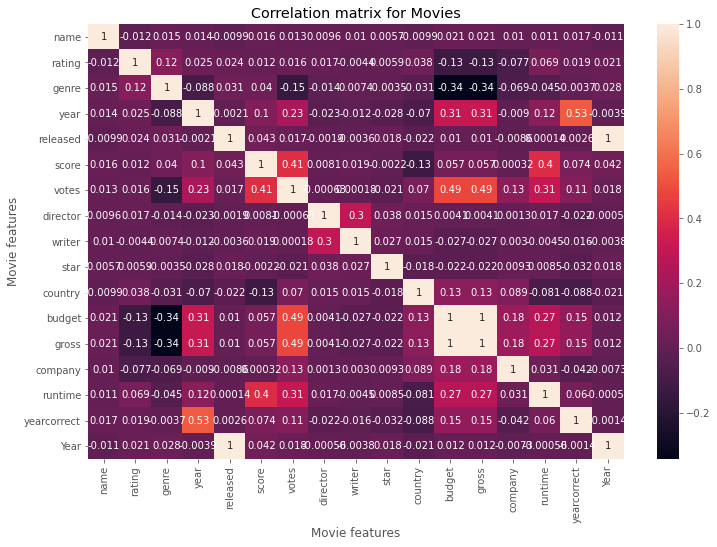

In [81]:
correlation_matrix = df_numerized.corr(method = 'pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title('Correlation matrix for Movies')

plt.xlabel('Movie features')

plt.ylabel('Movie features')

plt.show()


In [82]:
for col_name in df.columns:
    if(df[col_name].dtype == 'object'):
        df[col_name]= df[col_name].astype('category')
        df[col_name] = df[col_name].cat.codes

<AxesSubplot:xlabel='rating', ylabel='gross'>

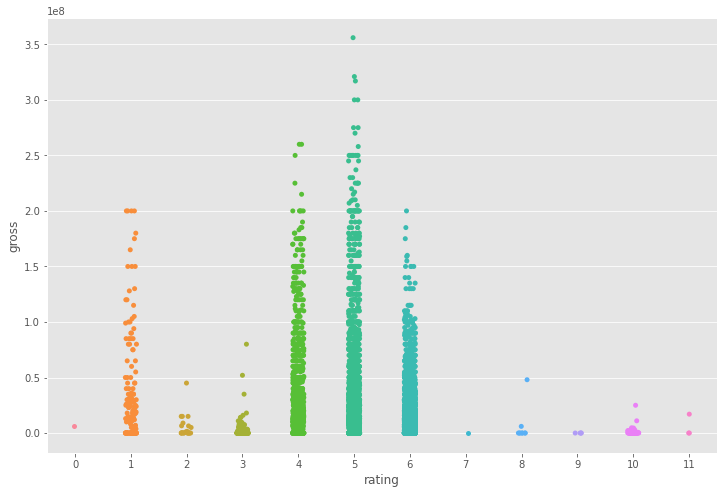

In [85]:
sns.stripplot(x="rating", y="gross", data=df)
